In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/hadi.hbus/.pytorch-datasets/George_W_Bush2.zip exists, skipping download.
Extracting /home/hadi.hbus/.pytorch-datasets/George_W_Bush2.zip...
Extracted 532 to /home/hadi.hbus/.pytorch-datasets/George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


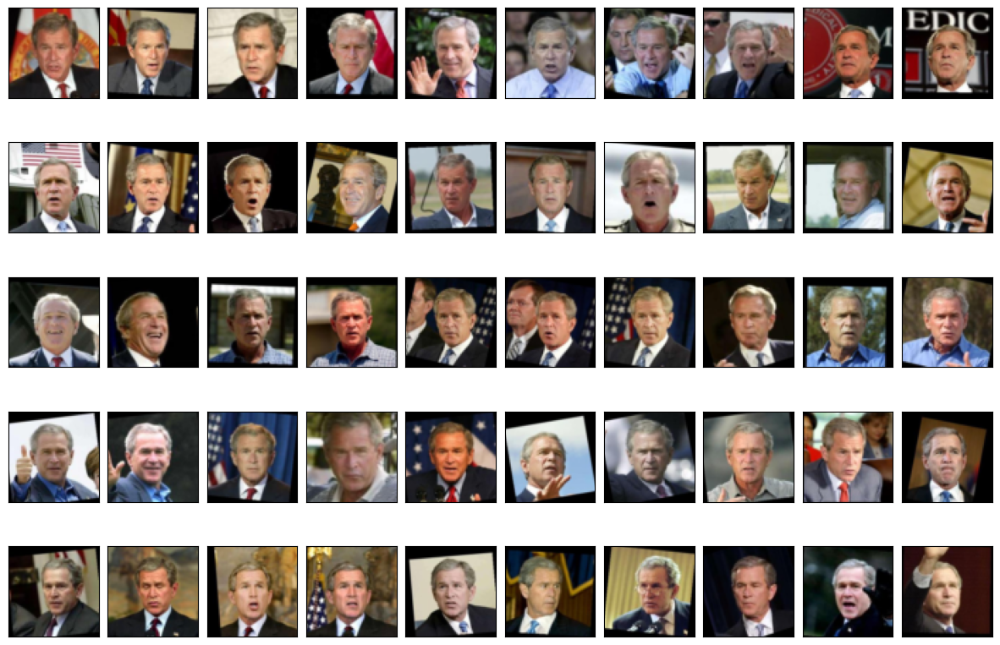

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>


GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\mathbf{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\mathbf{u}\sim\mathcal{N}(\mathbf{0},\mathbf{I})$ to an instance-space variable $\mathbf{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\mathbf{\gamma}}(\mathbf{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\mathbf{X})$.

- The Discriminator, $\Delta _{\mathbf{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\mathbf{x}$, returns the  probability that $\mathbf{x}$ is real, i.e. that $\mathbf{x}$
was sampled from $p(\mathbf{X})$ and not $p_{\mathbf{\gamma}}(\mathbf{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\mathbf{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\mathbf{z} \sim p(\mathbf{Z}) } \log (\Delta _{\mathbf{\delta}}(\Psi _{\mathbf{\gamma}} (\mathbf{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\mathbf{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\mathbf{x} \sim p(\mathbf{X}) } \log \Delta _{\mathbf{\delta}}(mathbf{x})  \, + \,
\mathbb{E} _{\mathbf{z} \sim p(\mathbf{Z}) } \log (1-\Delta _{\mathbf{\delta}}(\Psi _{\mathbf{\gamma}} (\mathbf{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\mathbf{\gamma}} \max _{\mathbf{\delta}} \,
\mathbb{E} _{\mathbf{x} \sim p(\mathbf{X}) } \log \Delta _{\mathbf{\delta}}(\mathbf{x})  \, + \,
\mathbb{E} _{\mathbf{z} \sim p(\mathbf{Z}) } \log (1-\Delta _{\mathbf{\delta}}(\Psi _{\mathbf{\gamma}} (\mathbf{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\mathbf{\gamma}$:

$$
L({\mathbf{\gamma}}) =
\max _{\mathbf{\delta}} \, \mathbb{E} _{\mathbf{x} \sim p(\mathbf{X}) } \log \Delta _{\mathbf{\delta}}(\mathbf{x})  \, + \,
  \mathbb{E} _{\mathbf{z} \sim p(\mathbf{Z}) } \log (1-\Delta _{\mathbf{\delta}}(\Psi _{\mathbf{\gamma}} (\mathbf{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): EncoderCNN(
    (cnn): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout2d(p=0.1, inplace=False)
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU()
      (7): Dropout2d(p=0.1, inplace=False)
      (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Dropout2d(p=0.1, inplace=False)
      (12): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (13): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (14): ReLU()
      (15): Dropout2d(p=0.1, inplace=False)
      (16): 

**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)

xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (Seq): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU()
  )
  (cnn): DecoderCNN(
    (cnn): Sequential(
      (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout2d(p=0.1, inplace=False)
      (4): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU()
      (7): Dropout2d(p=0.1, inplace=False)
      (8): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Dropout2d(p=0.1, inplace=False)
   

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\mathbf{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\mathbf{x} \sim p(\mathbf{X}) } \log \Delta _{\mathbf{\delta}}(\mathbf{x})  \, - \,
\mathbb{E} _{\mathbf{z} \sim p(\mathbf{Z}) } \log (1-\Delta _{\mathbf{\delta}}(\Psi _{\mathbf{\gamma}} (\mathbf{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\mathbf{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\mathbf{z} \sim p(\mathbf{Z}) } \log (\Delta _{\mathbf{\delta}}(\Psi _{\mathbf{\gamma}} (\mathbf{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\mathbf{\gamma}$ using this expression also depends on $\mathbf{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

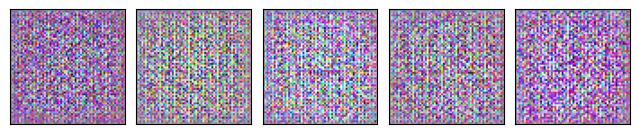

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 8, 'z_dim': 128, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999), 'weight_decay': 1e-05}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999), 'weight_decay': 1e-05}, 'data_label': 0, 'label_noise': 0.4}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.26it/s]
Discriminator loss: 0.34521192668089223
Generator loss:     6.470266698011711


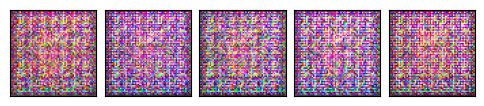

--- EPOCH 2/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.37it/s]
Discriminator loss: 0.15325026125160615
Generator loss:     6.558459659120929


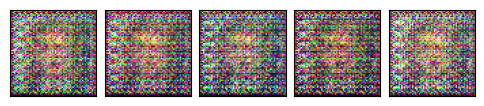

--- EPOCH 3/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.29it/s]
Discriminator loss: 0.12347335062587439
Generator loss:     5.765290263873427


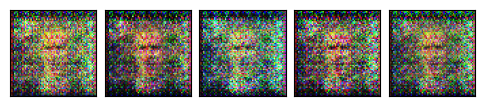

--- EPOCH 4/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.29it/s]
Discriminator loss: 0.6483797744583728
Generator loss:     3.6969355700620965


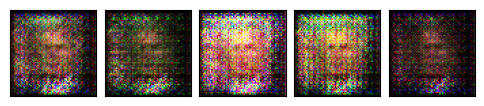

--- EPOCH 5/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.20it/s]
Discriminator loss: 0.5716024804582347
Generator loss:     3.0858127207898383
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


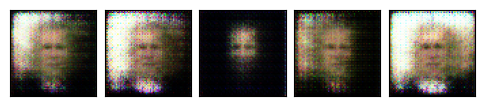

--- EPOCH 6/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.25it/s]
Discriminator loss: 0.7523533380520877
Generator loss:     2.558206731703744


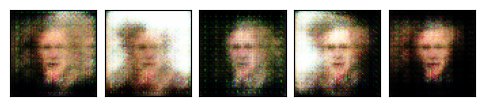

--- EPOCH 7/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.46it/s]
Discriminator loss: 0.40714530318753045
Generator loss:     3.8169314634444107


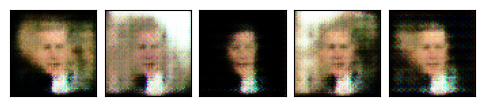

--- EPOCH 8/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.55it/s]
Discriminator loss: 0.5690901583032821
Generator loss:     3.8065262063225704


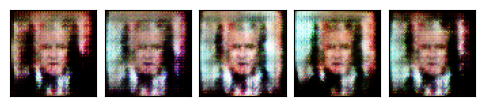

--- EPOCH 9/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.507473004676068
Generator loss:     4.093656257906956


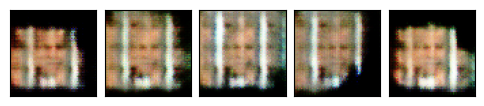

--- EPOCH 10/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.37it/s]
Discriminator loss: 0.4986573652322613
Generator loss:     4.503140007382009
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


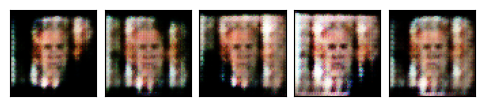

--- EPOCH 11/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.22it/s]
Discriminator loss: 0.560936767552326
Generator loss:     4.74646298209233


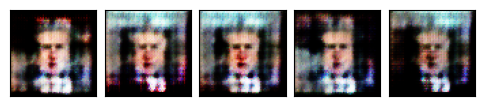

--- EPOCH 12/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.20it/s]
Discriminator loss: 0.43985393415413687
Generator loss:     4.274490110909761


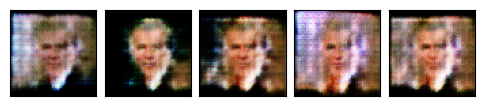

--- EPOCH 13/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.30it/s]
Discriminator loss: 0.519326297872102
Generator loss:     4.064158418285313


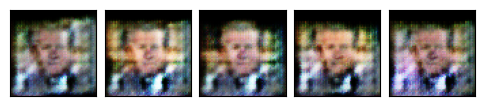

--- EPOCH 14/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.49it/s]
Discriminator loss: 0.6148594245870611
Generator loss:     4.23314685608024


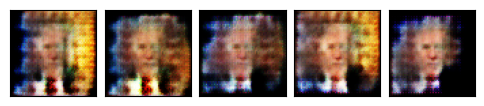

--- EPOCH 15/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.6178351996549919
Generator loss:     3.8524642773528597
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


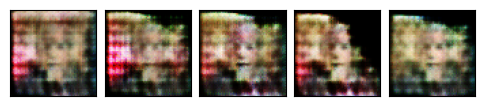

--- EPOCH 16/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.56it/s]
Discriminator loss: 0.5419991297174745
Generator loss:     4.724321805496714


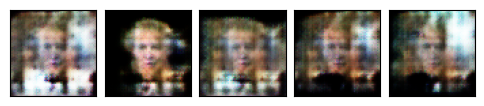

--- EPOCH 17/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.50it/s]
Discriminator loss: 0.5627637457992158
Generator loss:     4.468097889601295


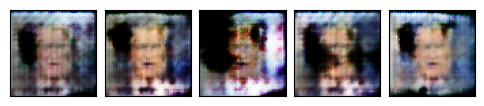

--- EPOCH 18/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.42it/s]
Discriminator loss: 0.525016085314217
Generator loss:     4.48771429239814


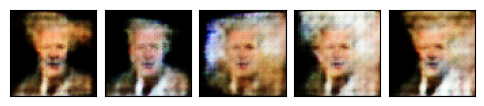

--- EPOCH 19/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.41it/s]
Discriminator loss: 0.5966450781074922
Generator loss:     4.382293541929615


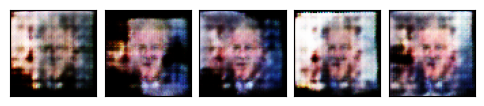

--- EPOCH 20/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.40it/s]
Discriminator loss: 0.5454406694912198
Generator loss:     4.360056400299072
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


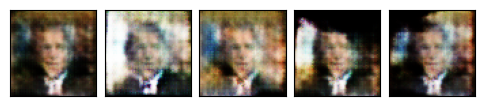

--- EPOCH 21/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.56it/s]
Discriminator loss: 0.5227019360372379
Generator loss:     4.817194821229622


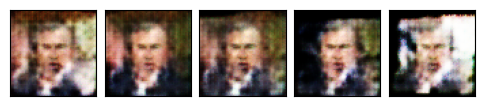

--- EPOCH 22/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.27it/s]
Discriminator loss: 0.5043813103337341
Generator loss:     4.860607280215221


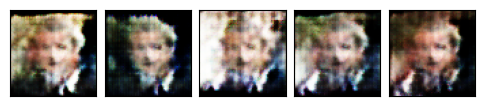

--- EPOCH 23/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.47it/s]
Discriminator loss: 0.4890914483190472
Generator loss:     5.027612974394613


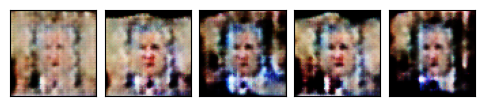

--- EPOCH 24/100 ---
100%|██████████| 67/67 [00:03<00:00, 18.84it/s]
Discriminator loss: 0.5504553396977595
Generator loss:     4.999466300010681


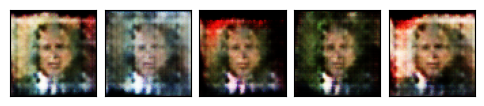

--- EPOCH 25/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.30it/s]
Discriminator loss: 0.40541861284134995
Generator loss:     5.047751458723154
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


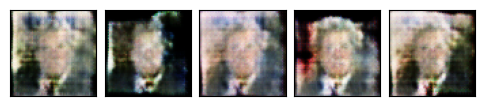

--- EPOCH 26/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.39it/s]
Discriminator loss: 0.31789072085894754
Generator loss:     5.891237159273517


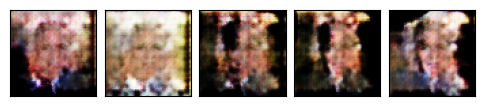

--- EPOCH 27/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.47it/s]
Discriminator loss: 0.44992839645093946
Generator loss:     5.328952832008476


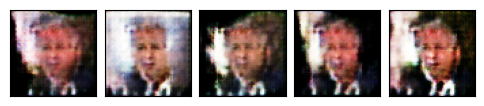

--- EPOCH 28/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.29it/s]
Discriminator loss: 0.36507840120970314
Generator loss:     5.908338593013251


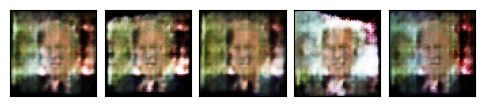

--- EPOCH 29/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.36it/s]
Discriminator loss: 0.45614152807575553
Generator loss:     4.987574855783093


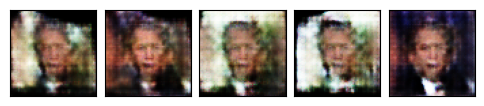

--- EPOCH 30/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.45it/s]
Discriminator loss: 0.5075804373499617
Generator loss:     4.942202802914292
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


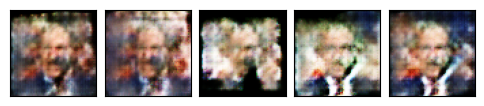

--- EPOCH 31/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.57it/s]
Discriminator loss: 0.53644866184957
Generator loss:     4.157608733248355


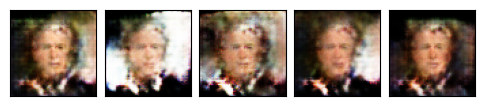

--- EPOCH 32/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.34it/s]
Discriminator loss: 0.5019830189534088
Generator loss:     4.598537018050009


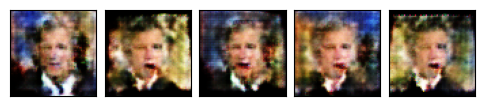

--- EPOCH 33/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.15it/s]
Discriminator loss: 0.4673159235337777
Generator loss:     5.033655871206255


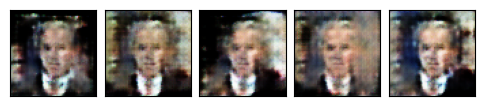

--- EPOCH 34/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.42it/s]
Discriminator loss: 0.3779479159570452
Generator loss:     5.518400637071524


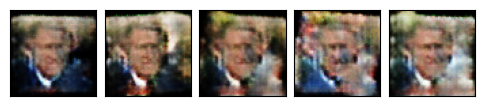

--- EPOCH 35/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.50it/s]
Discriminator loss: 0.5213762290442168
Generator loss:     5.459315339131142
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


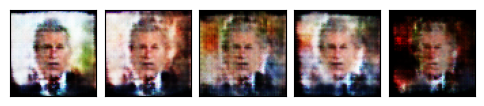

--- EPOCH 36/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.49it/s]
Discriminator loss: 0.3844893306160151
Generator loss:     5.387145860871272


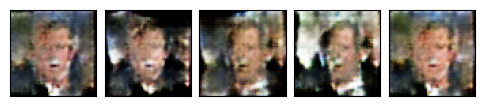

--- EPOCH 37/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.47it/s]
Discriminator loss: 0.5078256976471018
Generator loss:     4.603928188779461


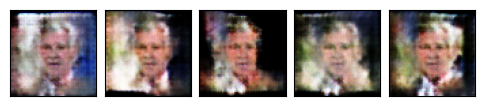

--- EPOCH 38/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.59it/s]
Discriminator loss: 0.4495920693474029
Generator loss:     4.737706351636061


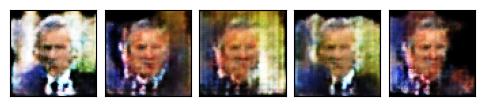

--- EPOCH 39/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.37it/s]
Discriminator loss: 0.39140164690898427
Generator loss:     5.801917008499601


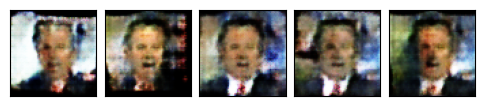

--- EPOCH 40/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.52it/s]
Discriminator loss: 0.3809586260745774
Generator loss:     5.406779645094231
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


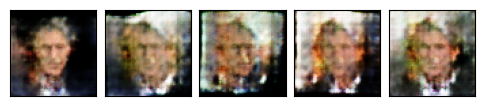

--- EPOCH 41/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.50it/s]
Discriminator loss: 0.4314625957118931
Generator loss:     5.906050482792641


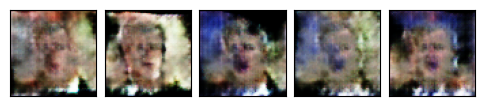

--- EPOCH 42/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.53it/s]
Discriminator loss: 0.45646133257159544
Generator loss:     5.330194327368665


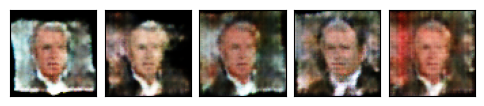

--- EPOCH 43/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.59it/s]
Discriminator loss: 0.35302996896763345
Generator loss:     5.687215805053711


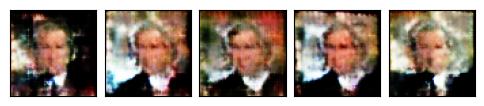

--- EPOCH 44/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.49it/s]
Discriminator loss: 0.4592507059560783
Generator loss:     5.628961481265168


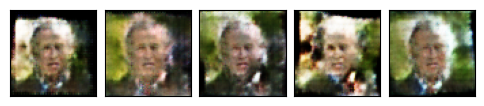

--- EPOCH 45/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.41it/s]
Discriminator loss: 0.39299516557757536
Generator loss:     5.058793902397156
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


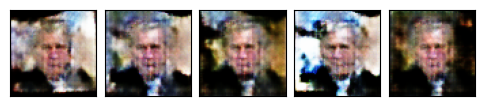

--- EPOCH 46/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.3015482519099961
Generator loss:     5.364995210918028


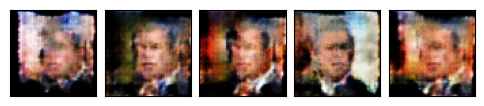

--- EPOCH 47/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.28it/s]
Discriminator loss: 0.40144919698585324
Generator loss:     5.576581887344815


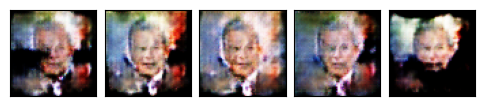

--- EPOCH 48/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.56it/s]
Discriminator loss: 0.3536920847732629
Generator loss:     5.30805481013967


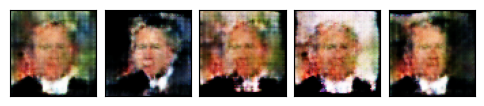

--- EPOCH 49/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.51it/s]
Discriminator loss: 0.34888947894101713
Generator loss:     6.0596265187904015


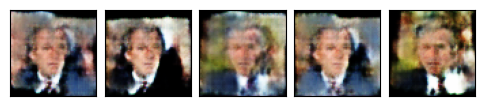

--- EPOCH 50/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.3674579180999478
Generator loss:     5.44356635079455
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


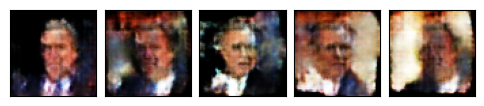

--- EPOCH 51/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.48it/s]
Discriminator loss: 0.4443556327205985
Generator loss:     5.2275493794412755


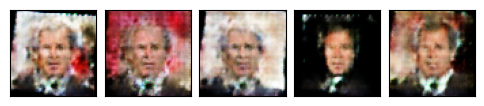

--- EPOCH 52/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.48it/s]
Discriminator loss: 0.4153754740619837
Generator loss:     5.523060595811303


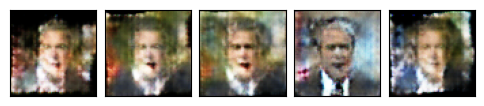

--- EPOCH 53/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.46it/s]
Discriminator loss: 0.2972474653385024
Generator loss:     5.117975928890171


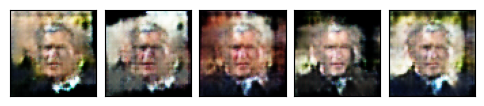

--- EPOCH 54/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.53it/s]
Discriminator loss: 0.3290232189778072
Generator loss:     6.222160097378404


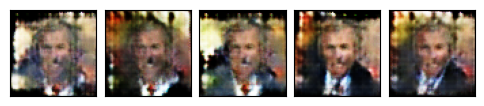

--- EPOCH 55/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.51it/s]
Discriminator loss: 0.31135744506965823
Generator loss:     5.762975714099941
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


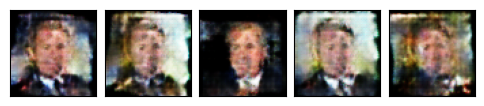

--- EPOCH 56/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.22it/s]
Discriminator loss: 0.3668355955672798
Generator loss:     5.942465757256124


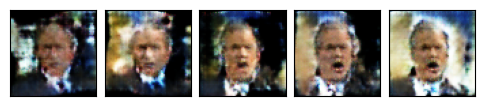

--- EPOCH 57/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.51it/s]
Discriminator loss: 0.3169061102306665
Generator loss:     5.75643019533869


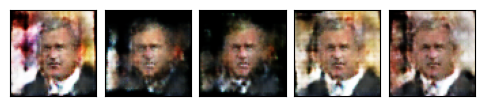

--- EPOCH 58/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.55it/s]
Discriminator loss: 0.24139764348962414
Generator loss:     6.753785396689799


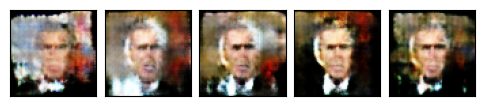

--- EPOCH 59/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.51it/s]
Discriminator loss: 0.32230252622446015
Generator loss:     6.084835274895625


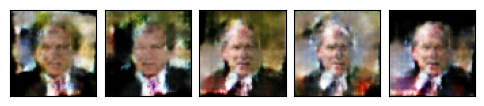

--- EPOCH 60/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.55it/s]
Discriminator loss: 0.35269349023922164
Generator loss:     6.485084733578251
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


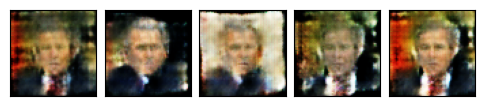

--- EPOCH 61/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.52it/s]
Discriminator loss: 0.3610753370865957
Generator loss:     4.983372293301483


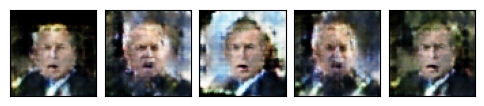

--- EPOCH 62/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.51it/s]
Discriminator loss: 0.3009327839670786
Generator loss:     5.791884701643417


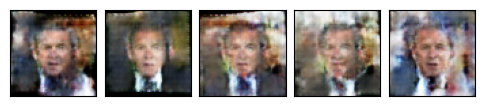

--- EPOCH 63/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.47it/s]
Discriminator loss: 0.2133497812076291
Generator loss:     5.796379608894462


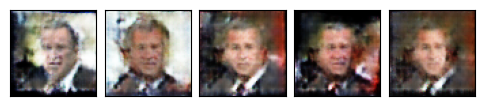

--- EPOCH 64/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.36it/s]
Discriminator loss: 0.40120080430338634
Generator loss:     6.51839256820394


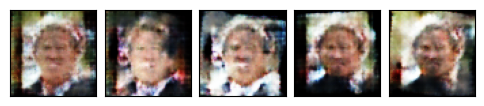

--- EPOCH 65/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.16it/s]
Discriminator loss: 0.1564807758958482
Generator loss:     6.515263643282563
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


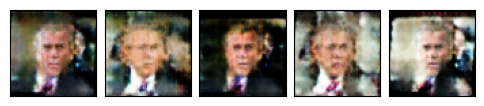

--- EPOCH 66/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.46it/s]
Discriminator loss: 0.4476581542794384
Generator loss:     6.7253534188911095


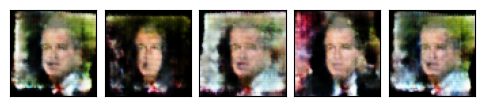

--- EPOCH 67/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.50it/s]
Discriminator loss: 0.2122049886010476
Generator loss:     6.090359186058614


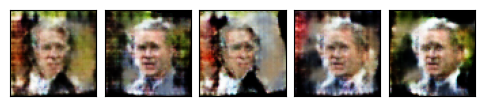

--- EPOCH 68/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.35it/s]
Discriminator loss: 0.2623331796989512
Generator loss:     6.291828013178128


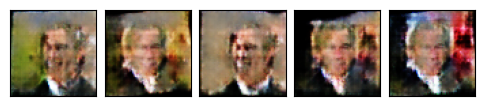

--- EPOCH 69/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.36it/s]
Discriminator loss: 0.4009323741740255
Generator loss:     6.314985762781172


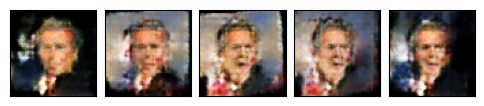

--- EPOCH 70/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.47it/s]
Discriminator loss: 0.3392195687698784
Generator loss:     5.096654311934514
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


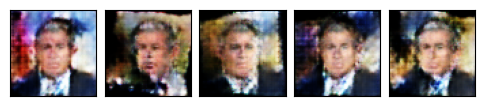

--- EPOCH 71/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.54it/s]
Discriminator loss: 0.2928416608040457
Generator loss:     4.844260468411801


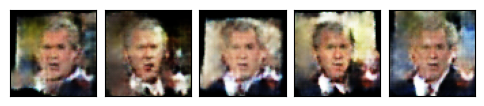

--- EPOCH 72/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.60it/s]
Discriminator loss: 0.2190043507560865
Generator loss:     5.7429276028675815


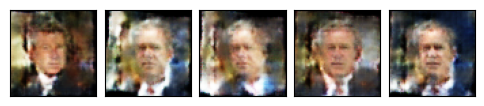

--- EPOCH 73/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.45it/s]
Discriminator loss: 0.21519308487203584
Generator loss:     6.2419927369302775


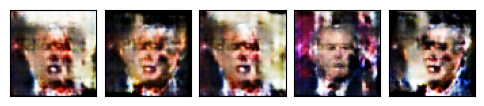

--- EPOCH 74/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.68it/s]
Discriminator loss: 0.3645358309149742
Generator loss:     6.04757072320625


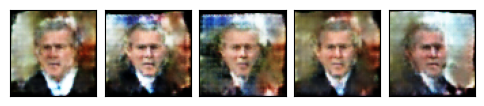

--- EPOCH 75/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.55it/s]
Discriminator loss: 0.27291334520525007
Generator loss:     6.3549089823196185
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


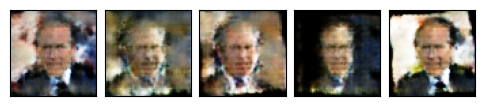

--- EPOCH 76/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.60it/s]
Discriminator loss: 0.19942072133964567
Generator loss:     6.22353577257982


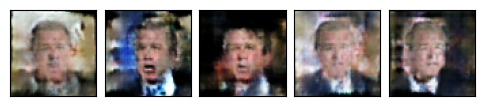

--- EPOCH 77/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.21218717748771854
Generator loss:     6.389053221958787


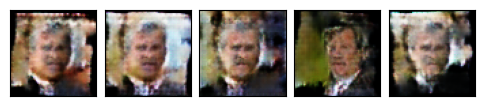

--- EPOCH 78/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.26it/s]
Discriminator loss: 0.12116278379933158
Generator loss:     7.216942847664677


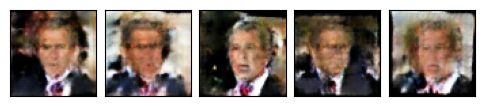

--- EPOCH 79/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.49it/s]
Discriminator loss: 0.21300724576880684
Generator loss:     7.319767051668309


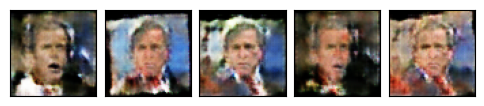

--- EPOCH 80/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.48it/s]
Discriminator loss: 0.16589065796848554
Generator loss:     6.902769530553426
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


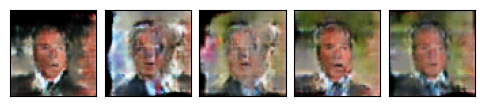

--- EPOCH 81/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.32it/s]
Discriminator loss: 0.3304349546557042
Generator loss:     6.732564376472538


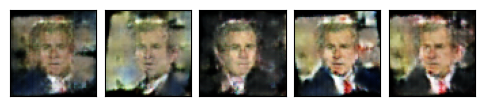

--- EPOCH 82/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.34it/s]
Discriminator loss: 0.32832311271731535
Generator loss:     5.977241654894245


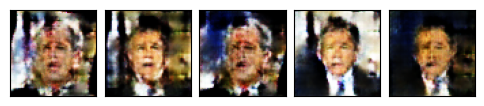

--- EPOCH 83/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.52it/s]
Discriminator loss: 0.230024917913017
Generator loss:     6.121706649438659


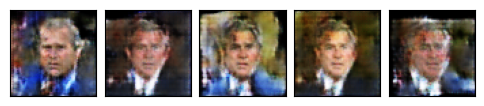

--- EPOCH 84/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.62it/s]
Discriminator loss: 0.21028440479022353
Generator loss:     5.449988903755795


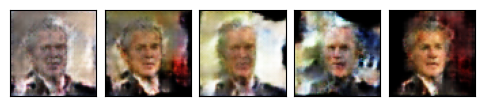

--- EPOCH 85/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.53it/s]
Discriminator loss: 0.3039332469786281
Generator loss:     6.567062627023725
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


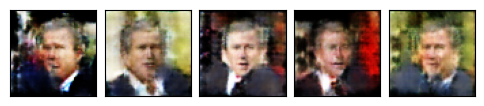

--- EPOCH 86/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.28it/s]
Discriminator loss: 0.17030409139706126
Generator loss:     6.459340896179427


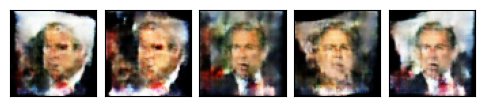

--- EPOCH 87/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.61it/s]
Discriminator loss: 0.1447366067389054
Generator loss:     7.8500104679990175


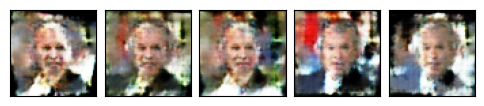

--- EPOCH 88/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.54it/s]
Discriminator loss: 0.014073420871994388
Generator loss:     6.884585953470486


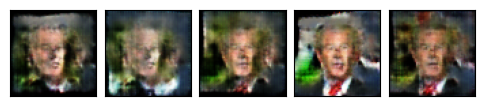

--- EPOCH 89/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.55it/s]
Discriminator loss: 0.3027466939234022
Generator loss:     8.147670454053737


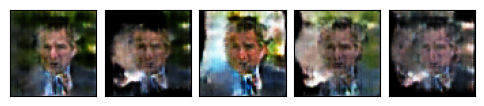

--- EPOCH 90/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.40it/s]
Discriminator loss: 0.1476072803028484
Generator loss:     8.223046210274768
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


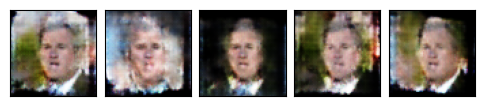

--- EPOCH 91/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.43it/s]
Discriminator loss: 0.28533123166703467
Generator loss:     6.523267126795071


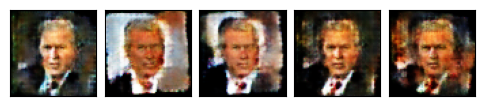

--- EPOCH 92/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.38it/s]
Discriminator loss: 0.17945224469277396
Generator loss:     7.361734456090785


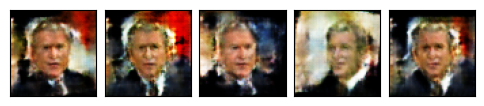

--- EPOCH 93/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.53it/s]
Discriminator loss: 0.1649765354483875
Generator loss:     7.639207501909626


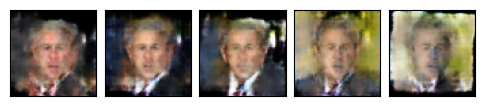

--- EPOCH 94/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.36it/s]
Discriminator loss: 0.2501721726869469
Generator loss:     6.736193824170241


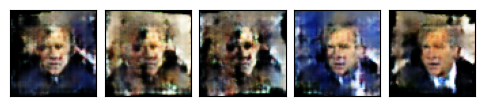

--- EPOCH 95/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.40it/s]
Discriminator loss: 0.22321002563433862
Generator loss:     8.199165739230256
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


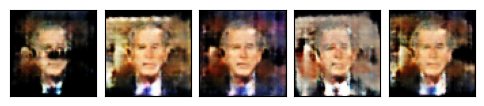

--- EPOCH 96/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.38it/s]
Discriminator loss: 0.13856413093075823
Generator loss:     6.910075362048932


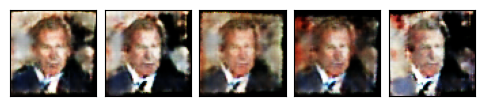

--- EPOCH 97/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.46it/s]
Discriminator loss: 0.23747511380421582
Generator loss:     7.605227224862397


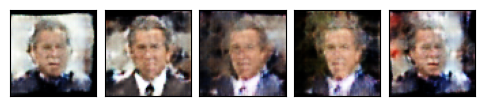

--- EPOCH 98/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.20it/s]
Discriminator loss: 0.21240558775503243
Generator loss:     6.540323549242162


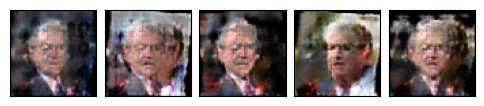

--- EPOCH 99/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.02it/s]
Discriminator loss: 0.1767535249688732
Generator loss:     7.991800173005061


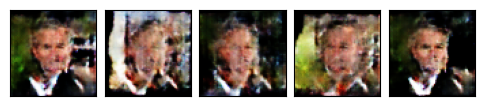

--- EPOCH 100/100 ---
100%|██████████| 67/67 [00:03<00:00, 19.61it/s]
Discriminator loss: 0.08176686787115994
Generator loss:     7.772534391773281
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


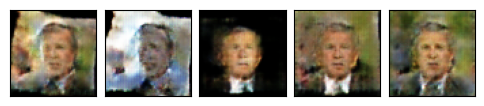

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


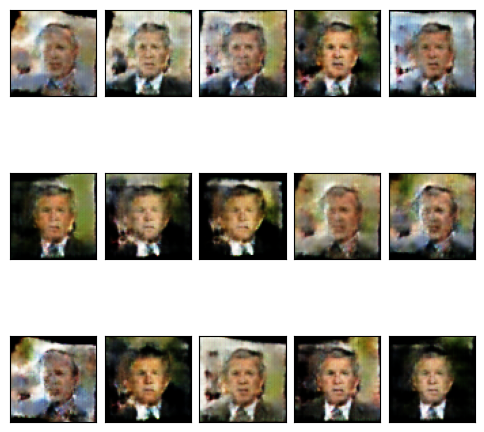

In [13]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [14]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [15]:
display_answer(hw3.answers.part3_q1)


**Answer:**

During GAN training, gradients are maintained when updating the parameters of either the Generator or the Discriminator.
When training the Generator, gradients are crucial because they indicate how changes in the Generator's
output affect the Discriminator's ability to classify fakes, allowing the Generator to improve.  Similarly,
when training the Discriminator, gradients are essential for the Discriminator to learn how to better distinguish real data from the Generator's
fakes.  However, once training is complete and the goal is simply to use the trained Generator to sample and create new data, 
gradients are discarded. In this phase, we're no longer adjusting the network's parameters, 
we're just leveraging the learned mapping from noise to data, making gradient calculation unnecessary and computationally wasteful.



### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [16]:
display_answer(hw3.answers.part3_q2)


**Answer:**

**1.** Stopping GAN training solely because the Generator loss is low is a bad idea. 
A low Generator loss can be misleading; it could mean the Generator is creating fantastic images,
but it could also mean the Discriminator isn't doing its job well, or that the Generator is only making a small variety of good images.
The goal is to find a balance where both the Generator and Discriminator are performing well and neither can easily improve without the 
other also improving. This balance is tricky to find directly.  Therefore, it's important to look at more than just the Generator loss.
Monitor both the Generator and Discriminator losses, and stop when they level off and aren't changing much. 

**2.** if the discriminator loss remains at a constant value while the generator loss decreases,
it suggests that the generator is improving and producing more realistic samples, 
but the discriminator is not adapting effectively to these changes. This could happen because the discriminator has reached a point where 
it can no longer distinguish between real and generated samples as effectively, or it may be stuck in a suboptimal state. 
The constant discriminator loss indicates that its performance is not improving, while the decreasing generator loss shows 
that the generator is becoming better at fooling the discriminator. This imbalance could lead to mode collapse or unstable training,
as the discriminator fails to provide meaningful feedback to the generator. 


### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [17]:
display_answer(hw3.answers.part3_q3)


**Answer:**


The main difference between the VAE and GAN-generated images is that VAE outputs appear blurry and smooth, 
while GAN outputs are sharper and more detailed. This difference is caused by how each model generates images:
VAEs optimize for a structured and continuous latent space by minimizing a reconstruction loss combined with a regularization term, 
which results in smooth but less detailed images. In contrast, GANs use an adversarial process where a generator competes against a discriminator, 
pushing the generator to produce more realistic and sharper images. However, while GANs generate high-quality images, 
they can introduce artifacts or suffer from mode collapse, producing less diverse outputs.

